# Assignment 1
Monday March 4th, 2019 at 23:59

In [3]:
# Imports
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import math

import folium
from folium import plugins
from IPython.display import Image

### Helping methods used thoughout the assignment

In [4]:
# Returns a subset of the data depending on given dates at cateories (type of crime)
def getSubSet(dates, crimes, data):
    subset = []
    for date in dates:
        subset.append(data.loc[data['Date'].str.contains(date)])
    subset = pd.concat(subset)
    result = []
    for crime in crimes:
        result.append(subset.loc[subset['Category'].str.contains(crime)])
    return pd.concat(result)

In [21]:
# Import data
#data1 = pd.read_csv("../../airbnb-listings.csv", sep=';')
#print(len(data1))
#dkset = data.loc[data['Country'].str.contains("Denmark", na=False)]
#dkset.to_csv("airbnbDK", sep='\t')
data = pd.read_csv('airbnbDK', sep='\t') 

In [6]:
data.head(5)

,Unnamed: 0,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,...,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,100,1.32726e+07,https://www.airbnb.com/rooms/13272604,2.017062e+13,2017-06-15,"Centralt, roligt, lyst, hyggeligt og charmerende","85 m2 i 2 plan - tæt på centrum, Frederiksberg...","Det er en charmerende og rummelig lejlighed, s...","85 m2 i 2 plan - tæt på centrum, Frederiksberg...",none,...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,2.16,"55.6952056557, 12.5112931088","Host Has Profile Pic,Is Location Exact"
1,101,6.45647e+06,https://www.airbnb.com/rooms/6456469,2.017062e+13,2017-06-15,Cozy rooms in hyggelig family apartment,Welcome to our home :) We normally rent out 2 ...,Welcome to our home :) Our home is the home of...,Welcome to our home :) We normally rent out 2 ...,none,...,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.6934389006, 12.4917170949","Host Has Profile Pic,Is Location Exact"
2,102,1.47852e+07,https://www.airbnb.com/rooms/14785236,2.017062e+13,2017-06-15,Idyllic CPH Villa Apartment near City Center,Our home will be the perfect choice for you an...,The architecture of our Villa apartment is cla...,Our home will be the perfect choice for you an...,none,...,10.0,6.0,8.0,NaN,NaN,moderate,1.0,0.15,"55.6952347435, 12.5072838591","Host Has Profile Pic,Is Location Exact"
3,103,3.75357e+06,https://www.airbnb.com/rooms/3753571,2.017062e+13,2017-06-15,Newyorkerstyle flat close to center,"Great New York-style apartment, situated in th...","Hi, my name is Birthe. The apartment is fully...","Great New York-style apartment, situated in th...",none,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.67,"55.6647654959, 12.6144187475","Host Has Profile Pic,Host Identity Verified,Is..."
4,104,1.6819e+07,https://www.airbnb.com/rooms/16819024,2.017062e+13,2017-06-15,"Bright and cozy, nordic design, Copenhagen",Charming modern apartment in a quiet location....,Kitchen: Feel free to use all of the equipment...,Charming modern apartment in a quiet location....,none,...,10.0,NaN,NaN,NaN,NaN,moderate,1.0,1.00,"55.6999702064, 12.5214007131","Host Has Profile Pic,Is Location Exact"


In [7]:
[print("- ",key) for key in data.keys()]

-  Unnamed: 0
-  ID
-  Listing Url
-  Scrape ID
-  Last Scraped
-  Name
-  Summary
-  Space
-  Description
-  Experiences Offered
-  Neighborhood Overview
-  Notes
-  Transit
-  Access
-  Interaction
-  House Rules
-  Thumbnail Url
-  Medium Url
-  Picture Url
-  XL Picture Url
-  Host ID
-  Host URL
-  Host Name
-  Host Since
-  Host Location
-  Host About
-  Host Response Time
-  Host Response Rate
-  Host Acceptance Rate
-  Host Thumbnail Url
-  Host Picture Url
-  Host Neighbourhood
-  Host Listings Count
-  Host Total Listings Count
-  Host Verifications
-  Street
-  Neighbourhood
-  Neighbourhood Cleansed
-  Neighbourhood Group Cleansed
-  City
-  State
-  Zipcode
-  Market
-  Smart Location
-  Country Code
-  Country
-  Latitude
-  Longitude
-  Property Type
-  Room Type
-  Accommodates
-  Bathrooms
-  Bedrooms
-  Beds
-  Bed Type
-  Amenities
-  Square Feet
-  Price
-  Weekly Price
-  Monthly Price
-  Security Deposit
-  Cleaning Fee
-  Guests Included
-  Extra People
-  Minimu

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [8]:
len(data)

20548

In [100]:
# Remove Nan
dataNotNan = data.dropna(subset=['Price', 'First Review', 'Last Review', 'Latitude', 'Longitude'])
print(len(data), len(dataNotNan))

20548 13362


In [101]:
dataNotNan.reset_index()

,index,Unnamed: 0,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,...,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,0,100,1.32726e+07,https://www.airbnb.com/rooms/13272604,2.017062e+13,2017-06-15,"Centralt, roligt, lyst, hyggeligt og charmerende","85 m2 i 2 plan - tæt på centrum, Frederiksberg...","Det er en charmerende og rummelig lejlighed, s...","85 m2 i 2 plan - tæt på centrum, Frederiksberg...",...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,2.16,"55.6952056557, 12.5112931088","Host Has Profile Pic,Is Location Exact"
1,2,102,1.47852e+07,https://www.airbnb.com/rooms/14785236,2.017062e+13,2017-06-15,Idyllic CPH Villa Apartment near City Center,Our home will be the perfect choice for you an...,The architecture of our Villa apartment is cla...,Our home will be the perfect choice for you an...,...,10.0,6.0,8.0,NaN,NaN,moderate,1.0,0.15,"55.6952347435, 12.5072838591","Host Has Profile Pic,Is Location Exact"
2,3,103,3.75357e+06,https://www.airbnb.com/rooms/3753571,2.017062e+13,2017-06-15,Newyorkerstyle flat close to center,"Great New York-style apartment, situated in th...","Hi, my name is Birthe. The apartment is fully...","Great New York-style apartment, situated in th...",...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.67,"55.6647654959, 12.6144187475","Host Has Profile Pic,Host Identity Verified,Is..."
3,4,104,1.6819e+07,https://www.airbnb.com/rooms/16819024,2.017062e+13,2017-06-15,"Bright and cozy, nordic design, Copenhagen",Charming modern apartment in a quiet location....,Kitchen: Feel free to use all of the equipment...,Charming modern apartment in a quiet location....,...,10.0,NaN,NaN,NaN,NaN,moderate,1.0,1.00,"55.6999702064, 12.5214007131","Host Has Profile Pic,Is Location Exact"
4,5,105,1.75064e+07,https://www.airbnb.com/rooms/17506370,2.017062e+13,2017-06-15,Copenhagen Beach,114 m2 appartment with 2 balcony's and 2 doubl...,"1st floor, although with elevator also. Plenty...",114 m2 appartment with 2 balcony's and 2 doubl...,...,10.0,10.0,9.0,NaN,NaN,strict,1.0,1.63,"55.6632591539, 12.6283070175","Host Has Profile Pic,Host Identity Verified"
5,6,106,1.35838e+07,https://www.airbnb.com/rooms/13583792,2.017062e+13,2017-06-15,Light and spacious apartment close to all you ...,The apartment is located close to public trans...,The apartment can also accommodate a small bab...,The apartment is located close to public trans...,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.35,"55.6566916163, 12.6095054491","Host Has Profile Pic,Host Identity Verified,Is..."
6,11,183,9.86021e+06,https://www.airbnb.com/rooms/9860214,2.017062e+13,2017-06-15,Villa just 30 min. from Cph centre,Villa in a quite neighborhood just 30 min. fro...,Room for a whole family or just some friends w...,Villa in a quite neighborhood just 30 min. fro...,...,10.0,10.0,10.0,NaN,NaN,flexible,1.0,0.16,"55.7042403681, 12.4778638352",Host Has Profile Pic
7,12,184,6.42729e+06,https://www.airbnb.com/rooms/6427286,2.017062e+13,2017-06-15,Lovly room in charming townhouse,A clean and simple room for 2 gests. Close to ...,Biside the room you have access to the kitchen...,A clean and simple room for 2 gests. Close to ...,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,1.00,"55.7012620598, 12.4744258575","Host Has Profile Pic,Is Location Exact"
8,13,185,1.66878e+07,https://www.airbnb.com/rooms/16687794,2.017062e+13,2017-06-15,Large apartment - spacious & bright,Large and bright apartment (155m2) room enough...,The apartment's large bright living and dinnin...,Large and bright apartment (155m2) room enough...,...,10.0,10.0,10.0,NaN,NaN,flexible,1.0,1.09,"55.7062542979, 12.4939881108","Host Has Profile Pic,Host Identity Verified,Is..."
9,14,186,9.99168e+06,https://www.airbnb.com/rooms/9991682,2.017062e+13,2017-06-15,Quiet residence near city center,"Cosy, light, kids friendly house with beautifu...",NaN,"Cosy, light, kids friendly house with 

In [102]:
set(dataNotNan['City'].values)

{'1366',
 '2150',
 '2200',
 '2300',
 '2500',
 '2700',
 'Amager',
 'Amagerbro',
 'Bronshoj',
 'Brønshøj',
 'Brønshøj, Copenhagen',
 'Brønshøj, København',
 'Brønshøj-Husum',
 'Christianshavn',
 'Copenhagen',
 'Copenhagen C',
 'Copenhagen K',
 'Copenhagen N',
 'Copenhagen N (Nørrebro)',
 'Copenhagen NV',
 'Copenhagen S',
 'Copenhagen S.',
 'Copenhagen V',
 'Copenhagen W',
 'Copenhagen k',
 'Copenhagen nv',
 'Copenhagen s',
 'Copenhagen Ø',
 'Copenhagen, Vanloese',
 'Copenhague',
 'Copenhaguen',
 'Cph',
 'Dyssegård',
 'FRB',
 'Frederiksberg',
 'Frederiksberg / København',
 'Frederiksberg C',
 'Frederiksberg C.',
 'Frederiksberg, Copenhagen',
 'Frederiksberg, DK',
 'Frederiksberg/ Copenhagen',
 'Hellerup',
 'Hvidovre',
 'KBH V',
 'Kastrup',
 'Kbh K',
 'Kbh N',
 'Kbh s',
 'Kbh sv',
 'Kbh. S',
 'Kbh. V',
 'Kobenhavn',
 'Kopenhagen',
 'Köpenhamn',
 'Københaven Copenhagen',
 'København',
 'København K',
 'København K.',
 'København N',
 'København N.',
 'København NV',
 'København S',
 'Københ

In [11]:
def isfloat(value):
  try:
    float(value)
    return True
  except ValueError:
    return False

In [12]:
def addCrimeLocations(m, fgv, color, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = color, 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [103]:
m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")

m = addCrimeLocations(m, fgv, 'Red', dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locations.html")
m
#Image("locations.png")

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


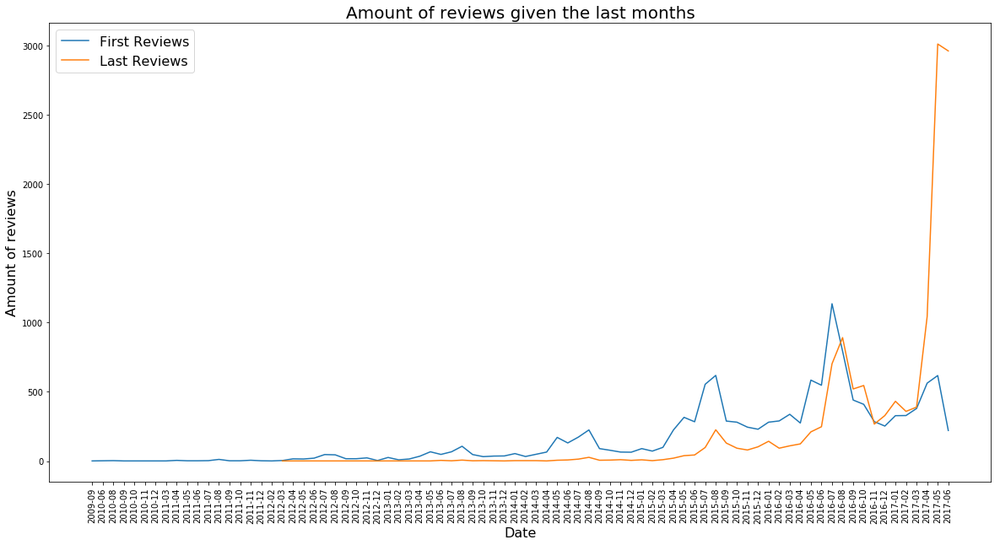

In [106]:
dataNotNan['First Review Month'] = [fr[:7] for fr in dataNotNan['First Review'].values]
firstReviewData = dataNotNan.groupby('First Review Month').count()['ID']

dataNotNan['Last Review Month'] = [fr[:7] for fr in dataNotNan['Last Review'].values]
lastReviewData = dataNotNan.groupby('Last Review Month').count()['ID']

plt.figure(figsize=(20,10))

plt.plot(firstReviewData.keys(), firstReviewData.values)


plt.plot(lastReviewData.keys(), lastReviewData.values)

plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['First Reviews','Last Reviews'], fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Amount of reviews', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.show()

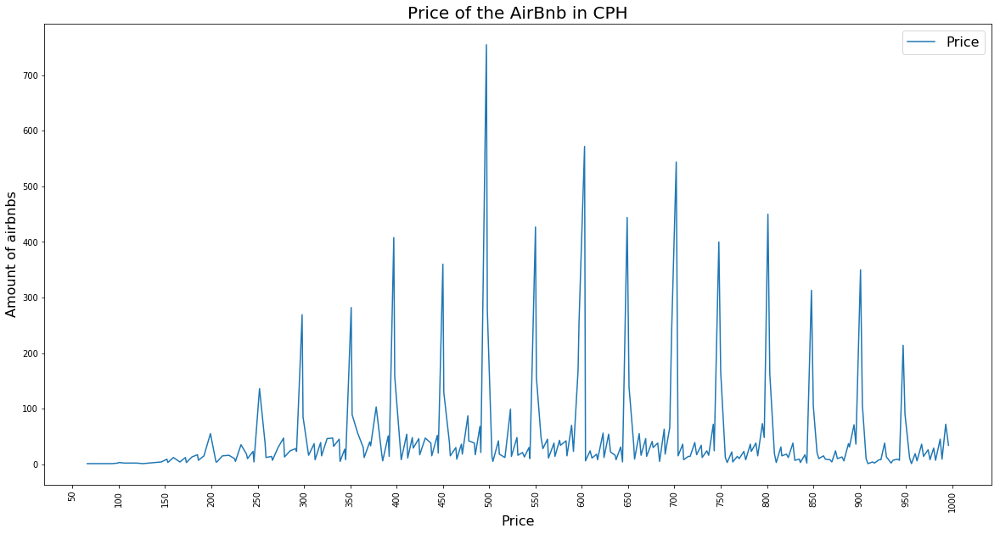

In [148]:
plt.figure(figsize=(20,10))
dataP = dataNotNan.groupby('Price')['ID'].count()

minP = min(dataP.keys())-min(dataP.keys())%50
maxP = max(dataP.keys())+50

plt.plot(dataP.keys(), dataP.values)

plt.xticks(np.arange(minP, maxP, 50.0), rotation='vertical')
plt.legend(['Price'], fontsize=16)
plt.xlabel('Price', fontsize=16)
plt.ylabel('Amount of airbnbs', fontsize=16)
plt.title('Price of the AirBnb in CPH', fontsize=20)
plt.show()